In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import pyarrow.feather as feather
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from scipy import stats

import warnings
warnings.filterwarnings('ignore')

In [3]:
aus = feather.read_feather('aus.feather')

In [101]:
df1 = aus.pivot(index = 'DATE', columns = 'SHORTNAME', values = 'RETURNS')

##### Remove NaN 

In [102]:
df1 = df1.replace({0:np.nan})
df1 = df1.dropna(thresh = len(df1)*0.2, axis = 1)
df1.shape

(267, 96)

##### Forward Fill NAN

In [93]:
df1 = df1.fillna(method = 'ffill')
df1.shape

(267, 101)

##### De-duplication

In [82]:
df1['dup'] = df1.duplicated()

df_undup = df1[df1['dup'] == False]

df1 = df_undup
df1.drop(columns = 'dup', inplace = True)
df1.shape

In [ ]:
def remove_outliers_IQR(df, list_of_co_cov):
    q1 = np.percentile(list_of_co_cov, 25, interpolation = "midpoint")
    q3 = np.percentile(list_of_co_cov, 75, interpolation = "midpoint")
    
        
    IQR = q3 - q1
        
    upper_bound = q3 + 1.5*IQR
    lower_bound = q1 - 1.5*IQR
    
    list_of_cov_updated = list_of_co_cov[(list_of_co_cov >= lower_bound) & (list_of_co_cov <= upper_bound)]
    list_of_analysts = list_of_cov_updated.index
    
    new_df = df[df["ANALYST"].isin(list_of_analysts)]
    
    return list_of_cov_updated, new_df

In [6]:
df1

SHORTNAME,Adelaide Brighton,AGL Energy,ALS,Alumina,Amcor,AMP,Ansell,APA Grp,APN News & Media,Aristocrat Leisure,...,Transurban Grp,Treasury Wine Estates,Twenty-First Century Fox - CL A,Twenty-First Century Fox - CL B,Westfield,Westpac Banking,Whitehaven Coal,Woodside Petroleum,Woolworths,WorleyParsons
DATE,,,,,,,,,,,,,,,,,,,,,
2012-01-02,-0.02357,-0.00891,-0.00615,-0.01953,-0.00284,-0.00937,0.00538,0.00417,0.00000,-0.01210,...,0.01457,0.00000,-0.01990,-0.00054,-0.00353,-0.01418,-0.00703,-0.00614,-0.00363,0.01136
2012-01-03,-0.01667,-0.00573,-0.01954,-0.04745,-0.01549,0.00998,-0.01011,-0.01833,-0.01657,-0.00725,...,-0.00893,0.00771,0.00163,-0.00371,0.00000,-0.00957,-0.00891,-0.02121,-0.00040,0.01124
2012-01-05,0.01967,0.00801,0.01035,-0.01293,0.00532,0.01639,-0.00067,-0.00766,-0.00595,-0.01613,...,0.00511,0.03009,0.00908,0.01216,0.00866,0.00440,-0.02632,0.03666,0.00887,-0.00319
2012-01-06,-0.03061,0.00066,-0.06088,-0.00508,-0.00268,-0.01031,0.02113,0.00000,-0.02581,-0.02389,...,0.00707,-0.01810,-0.01446,-0.01733,0.02090,0.00739,-0.02010,-0.00653,0.00719,-0.01712
2012-01-08,-0.00595,-0.00382,0.00235,-0.01471,-0.02520,-0.00748,-0.00452,-0.00612,-0.00935,-0.02542,...,0.00000,-0.00226,-0.01928,-0.01479,0.00600,0.00216,-0.02452,-0.00504,0.00525,-0.01648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-11-07,0.00000,0.00570,-0.00667,0.00362,0.01590,0.01126,0.00212,-0.00565,0.00680,0.00746,...,0.01055,0.00196,0.00000,0.00000,0.00541,0.00593,0.00000,0.00193,0.00391,-0.00539
2014-12-02,0.02015,0.03230,0.00873,0.01195,0.00935,0.02064,0.00314,0.01653,0.01163,0.03404,...,0.01037,0.02793,-0.00731,-0.00345,0.01902,0.00838,-0.01183,0.00901,0.00748,0.00319
2014-12-03,-0.00935,-0.01107,-0.00548,0.01702,-0.00682,-0.00802,-0.00158,-0.00906,-0.02479,-0.00965,...,0.00000,0.00000,-0.01426,-0.00966,-0.00958,-0.01021,-0.03143,-0.00725,-0.00519,-0.01788


#### Distance Matrix

In [7]:
corr = df1.corr()
d_corr = np.sqrt(0.5*(1-corr))

In [8]:
d_corr

SHORTNAME,Adelaide Brighton,AGL Energy,ALS,Alumina,Amcor,AMP,Ansell,APA Grp,APN News & Media,Aristocrat Leisure,...,Transurban Grp,Treasury Wine Estates,Twenty-First Century Fox - CL A,Twenty-First Century Fox - CL B,Westfield,Westpac Banking,Whitehaven Coal,Woodside Petroleum,Woolworths,WorleyParsons
SHORTNAME,,,,,,,,,,,,,,,,,,,,,
Adelaide Brighton,0.000000,0.609038,0.576847,0.612813,0.610713,0.529829,0.627673,0.648778,0.654672,0.608387,...,0.648569,0.637779,0.626464,0.622444,0.637197,0.558062,0.639646,0.558996,0.575795,0.590430
AGL Energy,0.609038,0.000000,0.630578,0.641298,0.597722,0.578041,0.639365,0.610617,0.615529,0.632997,...,0.602427,0.647443,0.674990,0.660160,0.607496,0.585891,0.655488,0.571476,0.598463,0.617467
ALS,0.576847,0.630578,0.000000,0.540855,0.570765,0.547086,0.631164,0.634937,0.597012,0.637953,...,0.649460,0.666715,0.628673,0.615964,0.668186,0.593913,0.547294,0.506814,0.594700,0.551992
Alumina,0.612813,0.641298,0.540855,0.000000,0.615321,0.572239,0.603597,0.667559,0.613948,0.622056,...,0.650636,0.672110,0.629212,0.622898,0.649339,0.592265,0.567343,0.529232,0.622169,0.525812
Amcor,0.610713,0.597722,0.570765,0.615321,0.000000,0.586052,0.605704,0.663327,0.651313,0.648207,...,0.599126,0.642892,0.629505,0.612161,0.616762,0.570698,0.643607,0.564894,0.553336,0.596512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Westpac Banking,0.558062,0.585891,0.593913,0.592265,0.570698,0.472805,0.560602,0.617097,0.648136,0.635435,...,0.602573,0.641527,0.620097,0.609444,0.586207,0.000000,0.653932,0.530588,0.475338,0.595147
Whitehaven Coal,0.639646,0.655488,0.547294,0.567343,0.643607,0.616420,0.614790,0.646459,0.652614,0.656483,...,0.693287,0.706239,0.647185,0.642530,0.665933,0.653932,0.000000,0.589327,0.690460,0.581251
Woodside Petroleum,0.558996,0.571476,0.506814,0.529232,0.564894,0.520328,0.592059,0.628859,0.623490,0.619362,...,0.623000,0.648786,0.617493,0.596157,0.590514,0.530588,0.589327,0.000000,0.553726,0.527393


#### Checking Outliers Using Z-score 

df_t = df1[['Transurban Grp', 'ALS']]
z = np.abs(stats.zscore(df_t))
threshold = 10
#remove outliers
df_no_outliers = df_t[(z < threshold).all(axis = 1)]

#### Dimension Reduction

In [9]:
# Standardize data
X = df1.reset_index().drop(columns='DATE')
sc = StandardScaler()
X_scaled = sc.fit_transform(X)

In [10]:
X_scaled_df = pd.DataFrame(X_scaled, columns = X.columns)

In [11]:
X_scaled_df

SHORTNAME,Adelaide Brighton,AGL Energy,ALS,Alumina,Amcor,AMP,Ansell,APA Grp,APN News & Media,Aristocrat Leisure,...,Transurban Grp,Treasury Wine Estates,Twenty-First Century Fox - CL A,Twenty-First Century Fox - CL B,Westfield,Westpac Banking,Whitehaven Coal,Woodside Petroleum,Woolworths,WorleyParsons
0,-1.683051,-0.896834,-0.257295,-0.771125,-0.319575,-0.867511,0.395036,0.364241,0.034936,-0.673065,...,1.523565,-0.144461,-1.570493,-0.154194,-0.407591,-1.453479,-0.245817,-0.601446,-0.446489,0.755247
1,-1.190341,-0.570490,-0.904002,-1.864550,-1.418856,0.763242,-0.934596,-1.737901,-0.443964,-0.418763,...,-1.007779,0.334700,0.015492,-0.405577,-0.090707,-0.996810,-0.325052,-1.955534,-0.065484,0.747681
2,1.404600,0.839565,0.539619,-0.512650,0.389526,1.303456,-0.124285,-0.741018,-0.137029,-0.884372,...,0.504564,1.725573,0.564288,0.852920,0.686692,0.387066,-1.058822,3.244272,1.027987,-0.162218
3,-2.185758,0.085278,-2.900632,-0.205222,-0.305671,-0.946731,1.746986,-0.025356,-0.711015,-1.291257,...,0.715689,-1.269341,-1.169761,-1.485647,1.785464,0.683257,-0.796671,-0.636488,0.829817,-1.040588
4,-0.424855,-0.374478,0.153236,-0.582360,-2.262651,-0.708228,-0.454761,-0.597138,-0.235294,-1.371480,...,-0.045869,-0.284916,-1.524821,-1.284224,0.447906,0.165170,-0.982958,-0.502607,0.600979,-1.000232
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,0.000019,0.602504,-0.282409,0.135494,1.308924,0.871116,0.115204,-0.553227,0.231467,0.352535,...,1.090543,-0.022651,-0.104581,-0.111372,0.394943,0.538629,0.050473,0.123670,0.442915,-0.300941
262,1.438876,3.332305,0.461376,0.461721,0.739732,1.661631,0.202759,1.519018,0.371062,1.746218,...,1.071154,1.591333,-0.643064,-0.384958,1.616698,0.781327,-0.448120,0.759831,0.864025,0.240080
263,-0.667639,-1.118502,-0.224935,0.660276,-0.665436,-0.753737,-0.202397,-0.871818,-0.681535,-0.544603,...,-0.045869,-0.144461,-1.155028,-0.877414,-0.950694,-1.060209,-1.274190,-0.701183,-0.630504,-1.088510
264,0.000019,0.339786,-0.082940,-0.446465,-1.403214,-0.398933,0.122929,0.244653,0.034936,0.168493,...,0.555191,-0.615544,-0.104581,-0.111372,-0.255882,-0.161729,0.497225,-0.681415,-0.882934,-0.267521


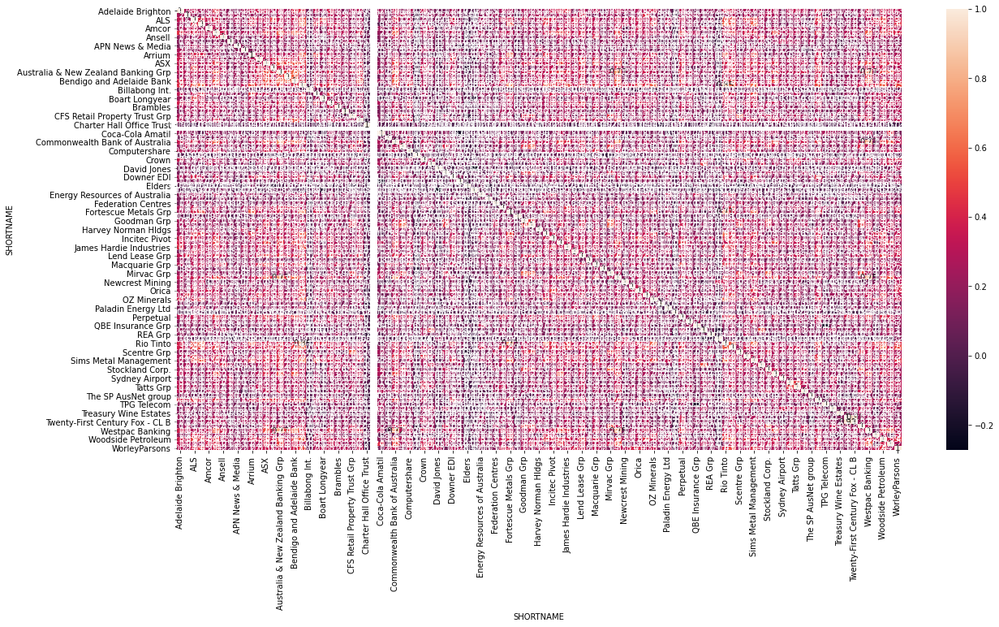

In [59]:
plt.figure(figsize = (20, 10))
sns.heatmap(X_scaled_df.corr(), annot = True)
plt.savefig('corr1.png')

##### PCA

In [13]:
pca = PCA()
pca.fit(X_scaled.T)
var_cumsum = np.cumsum(pca.explained_variance_ratio_)

len(var_cumsum[var_cumsum<=0.9])

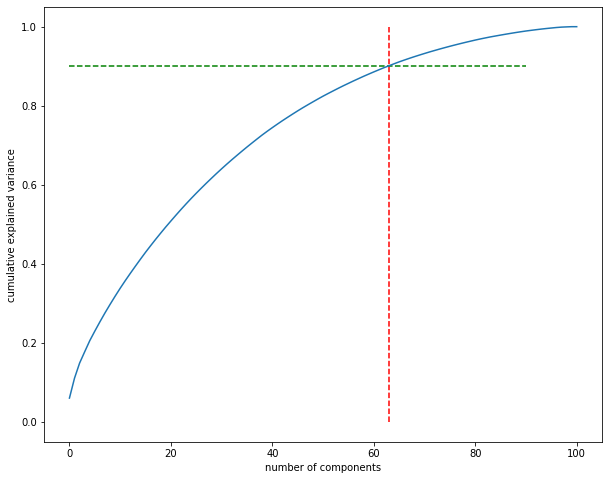

In [15]:
fig = plt.figure(figsize=[10, 8])#dpi = 200
plt.vlines(x=63, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.9, xmax=90, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumsum)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

In [16]:
#Performing PCA with 59 components -- Incremental PCA (not need to normalize)
pca_increment = IncrementalPCA(n_components = 59)
X_pca_incremant = pca_increment.fit_transform(X)

X_pca_incremant.shape

In [18]:
var_cumsum_incre = np.cumsum(pca_increment.fit(X).explained_variance_ratio_)
len(var_cumsum_incre[var_cumsum_incre<0.9])

41

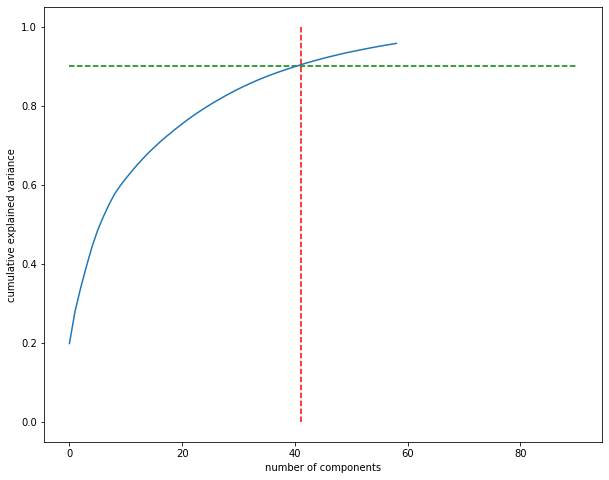

In [19]:
fig = plt.figure(figsize=[10, 8])#dpi = 200
plt.vlines(x=41, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.9, xmax=90, xmin=0, colors="g", linestyles="--")
plt.plot(var_cumsum_incre)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

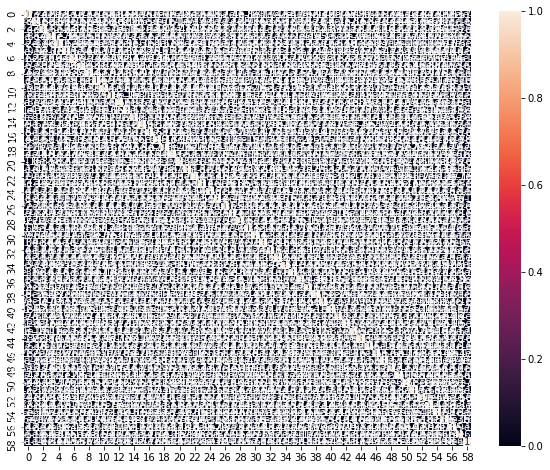

In [60]:
corrmat = np.corrcoef(X_pca_incremant.transpose())
plt.figure(figsize=(10, 8))
sns.heatmap(corrmat, annot = True);
plt.savefig('CorrM_after_PCA.png')

#### components in each PC

In [21]:
"""
PCA loadings are the coefficients of the linear combination of the original variables from 
which the principal components (PCs) are constructed.
"""
pca_top = PCA(63)
PC_top = pca_top.fit_transform(X_scaled.T)
loadings_ = pca_top.components_.T * np.sqrt(pca_top.explained_variance_)
pc_list = []
for i in range(1, 64):
    name = "PC{}".format(i)
    pc_list.append(name)

loadings = pd.DataFrame(loadings_, columns = pc_list, index = df1.index)

loadings

In [23]:
var = np.abs(loadings['PC9']).sort_values(ascending = False)

In [25]:
def show_components(pc_list_):
    name_df = pd.DataFrame(columns = ['PC1'])
    var = np.abs(loadings['PC1']).sort_values(ascending = False)
    name_list = var[var>=0.3].index.tolist()
    name_df['PC1'] = name_list
    for pc in pc_list[1:]:
        var = np.abs(loadings[pc]).sort_values(ascending = False)
        name_list = var[var>=0.3].index.tolist()
        name_df_next = pd.DataFrame(columns = [pc])
        name_df_next[pc] = name_list
        name_df = name_df.join(name_df_next)
    return name_df

In [26]:
pc_components = show_components(pc_list)

pc_components.dropna(axis = 1, how = 'all', inplace = True)

pc_components

In [29]:
"""
If a stock appear in more than one components, collect the stock name.
"""
def compare():
    n = 0
    n_list = []
    k_list = []
    for i in range(len(pc_components.columns)-1):
        for j in range(i+1, len(pc_components.columns)):
            for k in range(len(pc_components)):
                if pc_components.iloc[k, j] in pc_components.iloc[:, i]:
                    corp = pc_components.iloc[j, k]
                    pc1 = pc_components.columns[i]
                    pc2 = pc_components.columns[j]
                    n+=1
                    n_list.append(i)
                    n_list.append(j)
                    k_list.append(k)
                    #if np.abs(loadings.loc[corp, pc1]) >= np.abs(loadings.loc[corp, pc2]):
                        #pc_components.iloc[j, k] = np.nan
                    #else:
                        #pc_components.iloc[i, k] = np.nan
    return n, n_list 
n, n_list = compare()
n, n_list

(0, [])

In [30]:
def get_final_names(pc_list_):
    n_list = []
    for pc in pc_list_:
        var = np.abs(loadings[pc]).sort_values(ascending = False)
        name_list = var[var>=0.3].index.tolist()
        for name in name_list:
            n_list.append(name)
    return n_list

In [31]:
final_names = pd.DataFrame()
final_names['final_names'] = get_final_names(pc_list)

f_names = final_names['final_names'].unique()

df1_scaled = pd.DataFrame(index = df1.index, columns = df1.columns, data = sc.fit_transform(df1))

X_scaled_pca = df1_scaled.copy()
for x in df1.index:
    if x not in f_names:
        X_scaled_pca.drop(index = x, inplace = True)

X_scaled_pca

#### Clustering before and after PCA 

##### Ward 

###### - Euclidean 

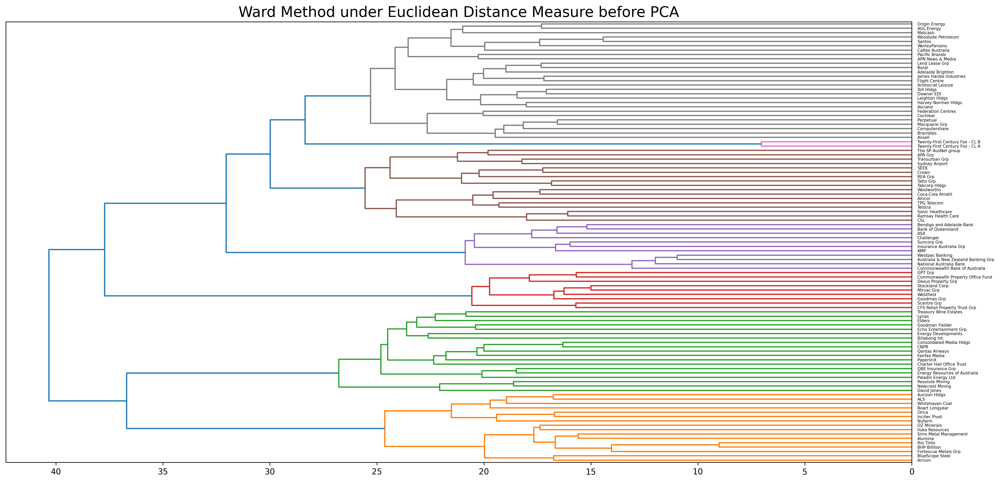

In [61]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'ward', metric = 'euclidean')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Ward Method under Euclidean Distance Measure before PCA', fontsize = 18)
plt.savefig('Ward_Euclidean_pre _PCA.png')
plt.show()

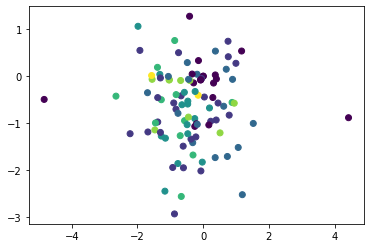

In [37]:
ac = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
ac.fit(X_scaled_df.T)
labels_WE = ac.fit_predict(X_scaled_df.T)
plt.scatter(X_scaled_df.T.iloc[:,0], X_scaled_df.T.iloc[:,1], c=labels_WE)
#plt.title('Ward Method under Euclidean Distance Measure before PCA', fontsize = 18)
plt.show()

In [38]:
def TDfig(X, labels_):
    x = X.iloc[:, 0]
    y = X.iloc[:, 8]
    z = X.iloc[:, 28]
    fig = plt.figure(figsize = (5, 5))
    ax = Axes3D(fig)
    sc = ax.scatter(x, y, z, s = 40, c = labels_, marker = 'o', alpha = 0.9, cmap = 'rainbow')
    #plt.legend(*sc.legend_elements())
    #plt.title('Ward Method under Euclidean Distance Measure before PCA', fontsize = 18)

TDfig(X_scaled_df.T, labels_WE)

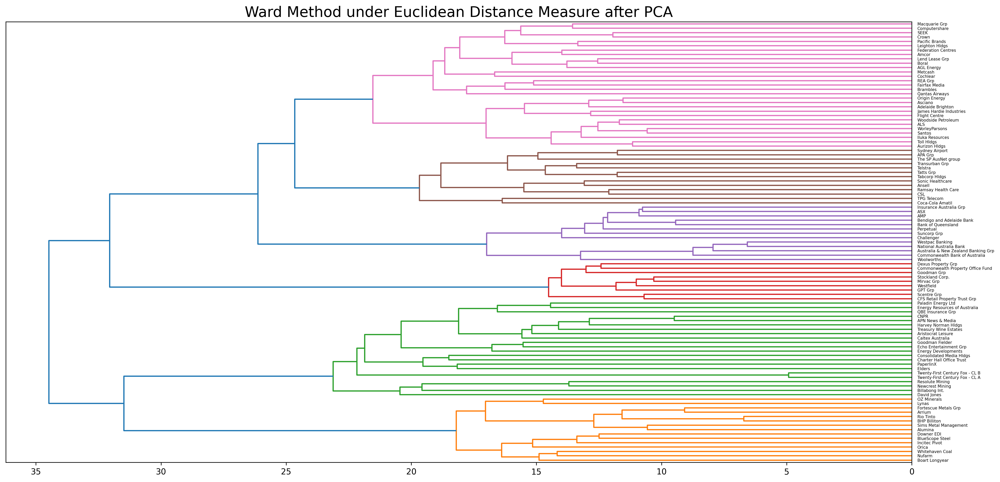

In [62]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_pca.T, method = 'ward', metric = 'euclidean')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Ward Method under Euclidean Distance Measure after PCA', fontsize = 18)
plt.savefig('Ward_Euclidean_PCA.png')
plt.show()

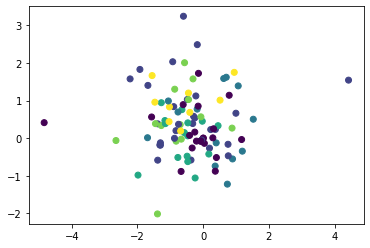

In [41]:
ac = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='ward')
ac.fit(X_scaled_pca.T)
labels_WE_pca = ac.fit_predict(X_scaled_pca.T)
plt.scatter(X_scaled_pca.T.iloc[:,0], X_scaled_pca.T.iloc[:,1], c=labels_WE_pca)
plt.show()

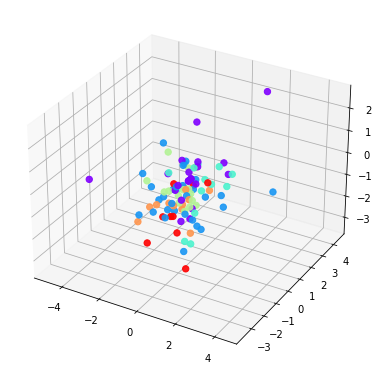

In [42]:
TDfig(X_scaled_pca.T, labels_WE_pca)

##### Average 

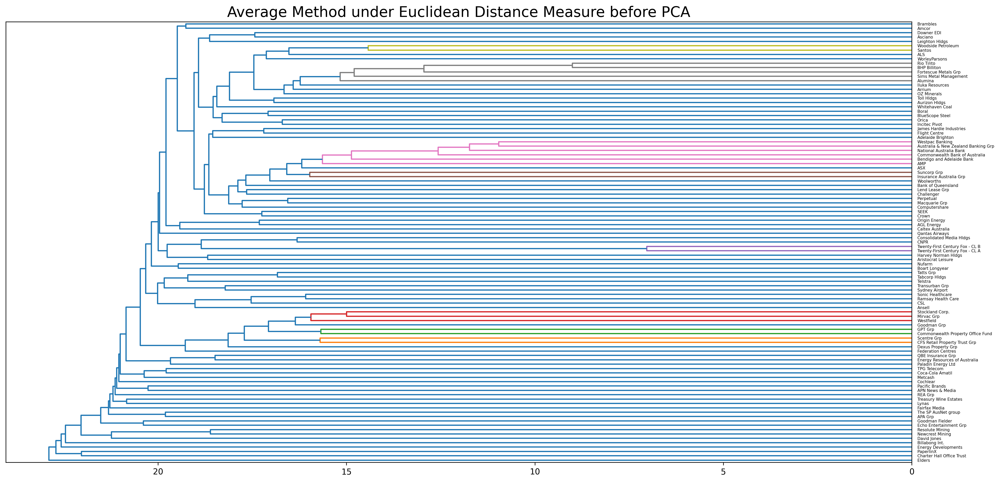

In [63]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'average', metric = 'euclidean')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Average Method under Euclidean Distance Measure before PCA', fontsize = 18)
plt.savefig('Average_Euclidean_pre_PCA.png')
plt.show()

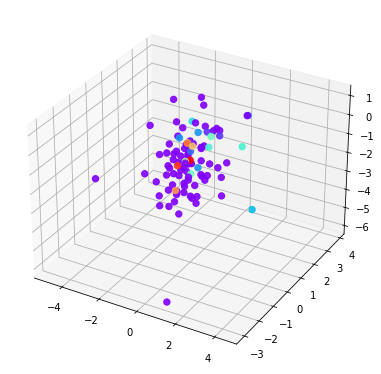

In [44]:
ac = AgglomerativeClustering(n_clusters=16, affinity='euclidean', linkage='average')
ac.fit(X_scaled_pca.T)
labels_AE = ac.fit_predict(X_scaled_df.T)
TDfig(X_scaled_df.T, labels_AE)

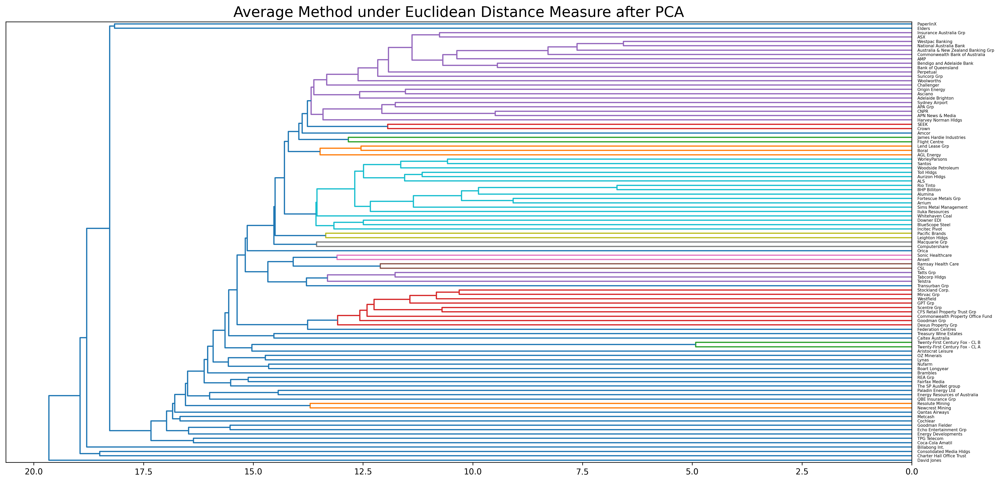

In [64]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_pca.T, method = 'average', metric = 'euclidean')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Average Method under Euclidean Distance Measure after PCA', fontsize = 18)
plt.savefig('Average_Euclidean_PCA.png')
plt.show()

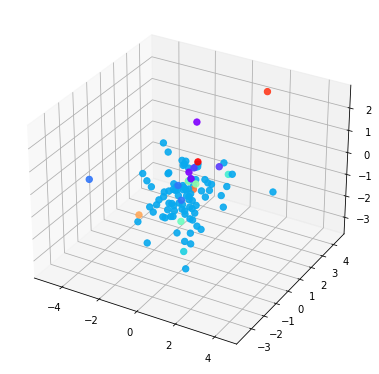

In [46]:
ac = AgglomerativeClustering(n_clusters=14, affinity='euclidean', linkage='average')
ac.fit(X_scaled_pca.T)
labels_AE_pca = ac.fit_predict(X_scaled_pca.T)
TDfig(X_scaled_pca.T, labels_AE_pca)

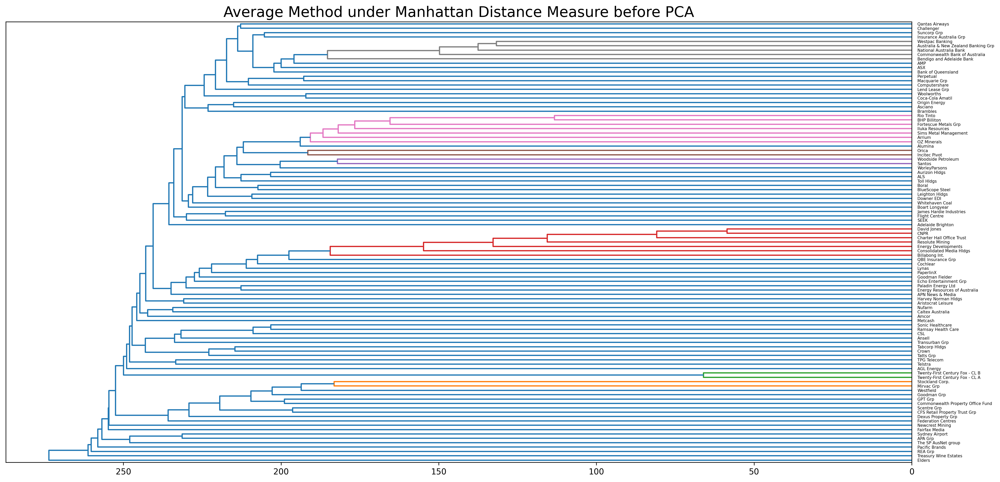

In [110]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'average', metric = 'cityblock')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Average Method under Manhattan Distance Measure before PCA', fontsize = 18)
plt.savefig('Average_Manhattan_pre_PCA.png')
plt.show()

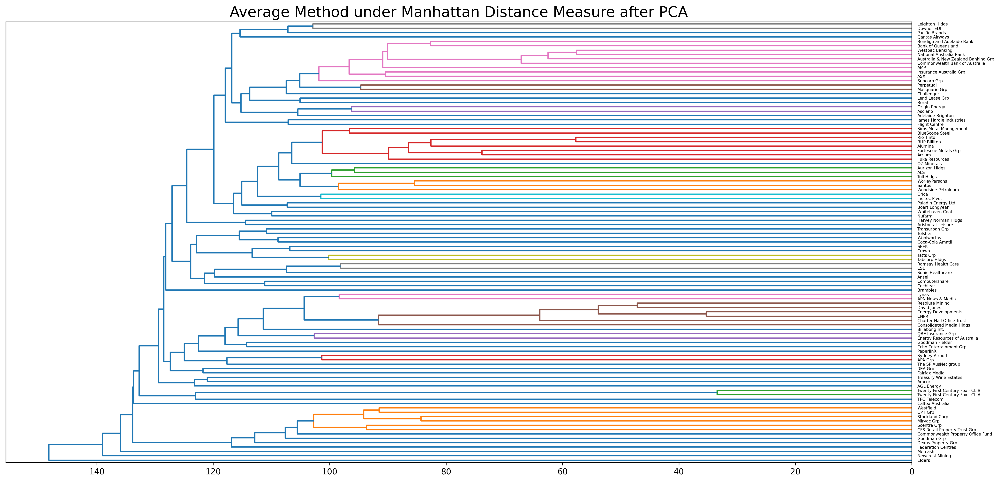

In [112]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'average', metric = 'cityblock')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Average Method under Manhattan Distance Measure after PCA', fontsize = 18)
plt.savefig('Average_Manhattan_PCA.png')
plt.show()

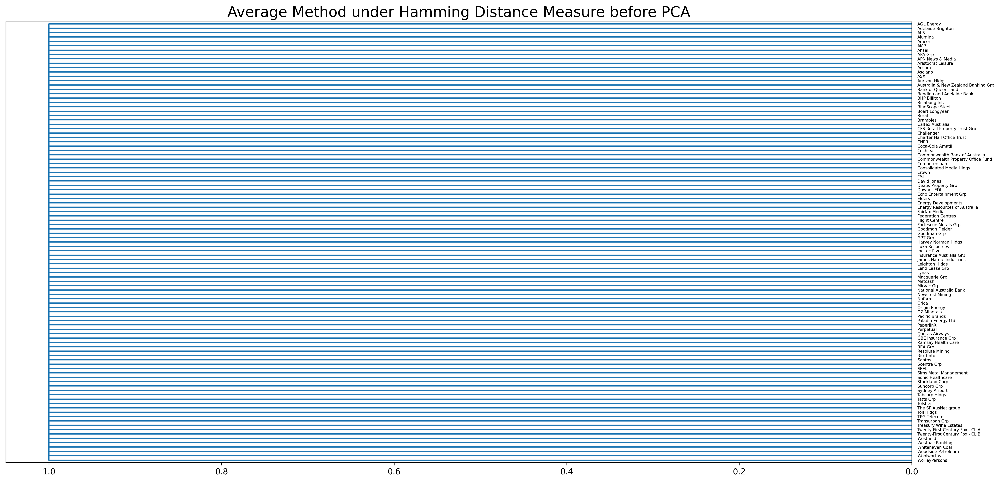

In [113]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'average', metric = 'hamming')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Average Method under Hamming Distance Measure before PCA', fontsize = 18)
plt.savefig('Average_Hamming_pre_PCA.png')
plt.show()

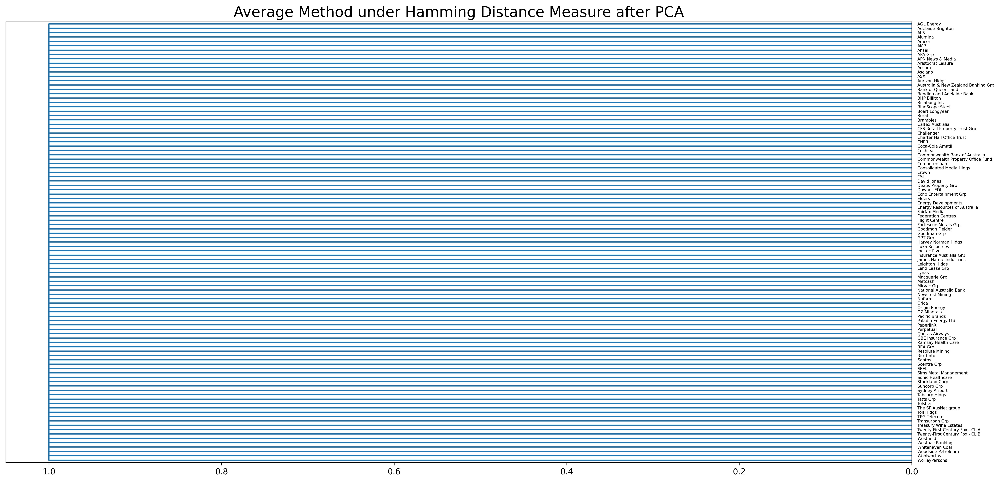

In [114]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'average', metric = 'hamming')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Average Method under Hamming Distance Measure after PCA', fontsize = 18)
plt.savefig('Average_Hamming_PCA.png')
plt.show()

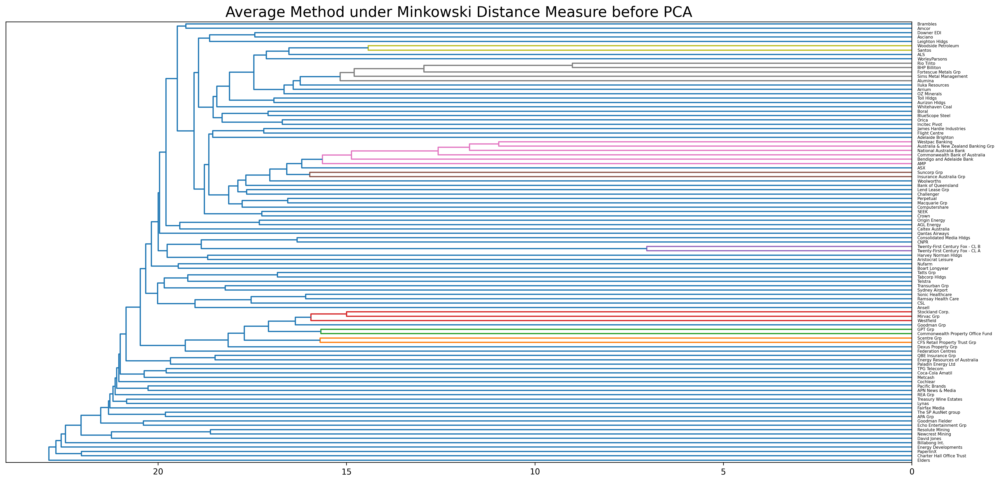

In [115]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'average', metric = 'minkowski')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Average Method under Minkowski Distance Measure before PCA', fontsize = 18)
plt.savefig('Average_Minkowski_pre_PCA.png')
plt.show()

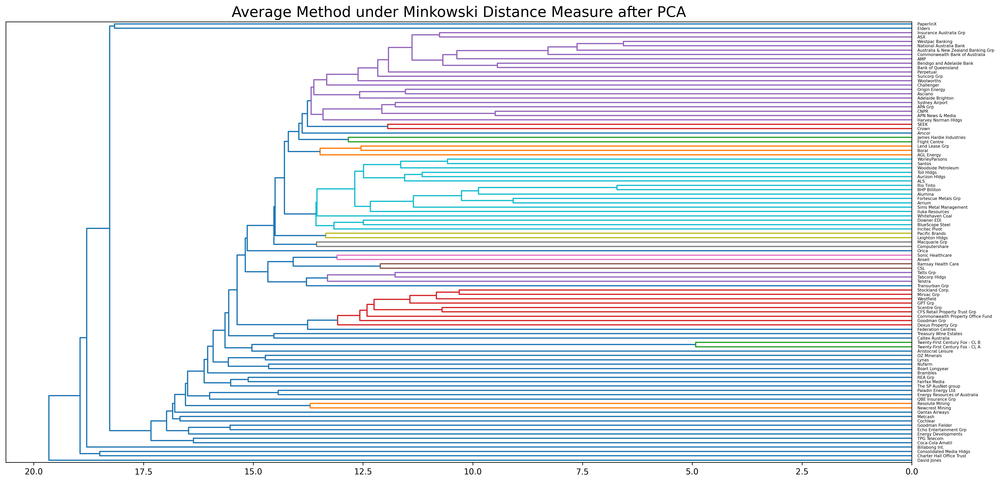

In [117]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'average', metric = 'minkowski')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Average Method under Minkowski Distance Measure after PCA', fontsize = 18)
plt.savefig('Average_Minkowski_PCA.png')
plt.show()

###### - Jaccard  

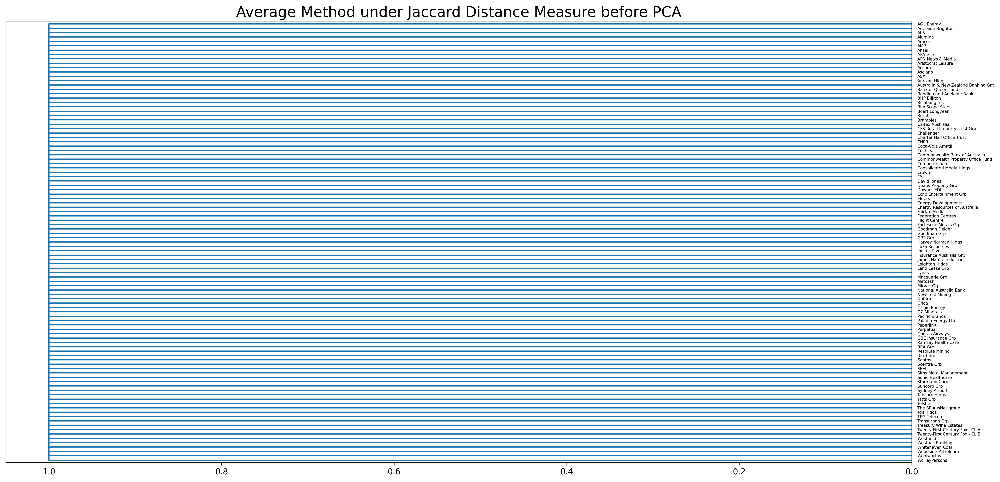

In [65]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'average', metric = 'jaccard')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Average Method under Jaccard Distance Measure before PCA', fontsize = 18)
plt.savefig('Average_Jaccard_pre_PCA.png')
plt.show()

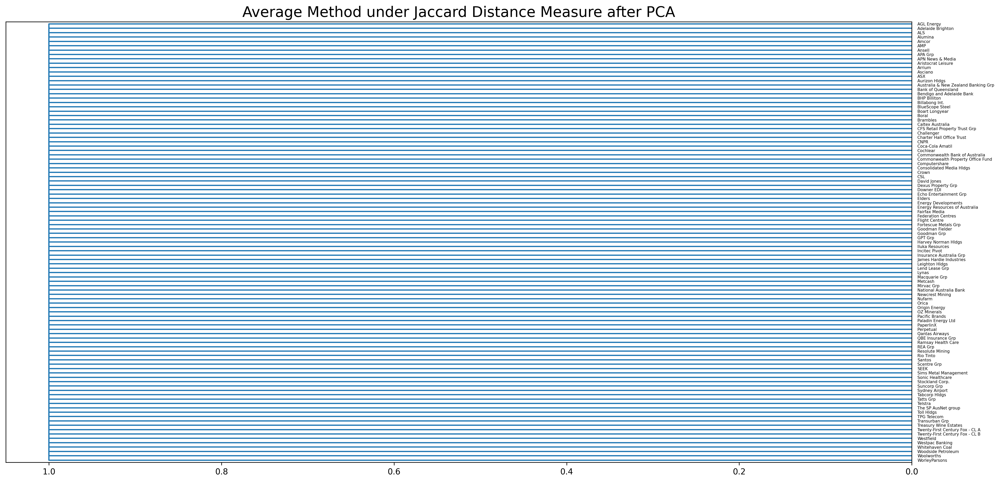

In [66]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_pca.T, method = 'average', metric = 'jaccard')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Average Method under Jaccard Distance Measure after PCA', fontsize = 18)
plt.savefig('Average_Jaccard_PCA.png')
plt.show()

##### Single 

###### - Euclidean

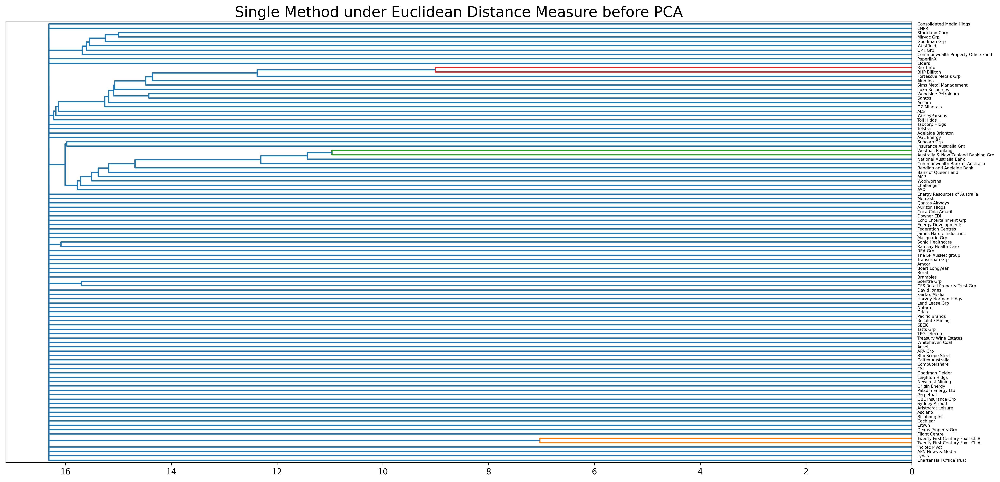

In [124]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'single', metric = 'euclidean')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Single Method under Euclidean Distance Measure before PCA', fontsize = 18)
plt.savefig('Single_Euclidean_pre_PCA.png')
plt.show()

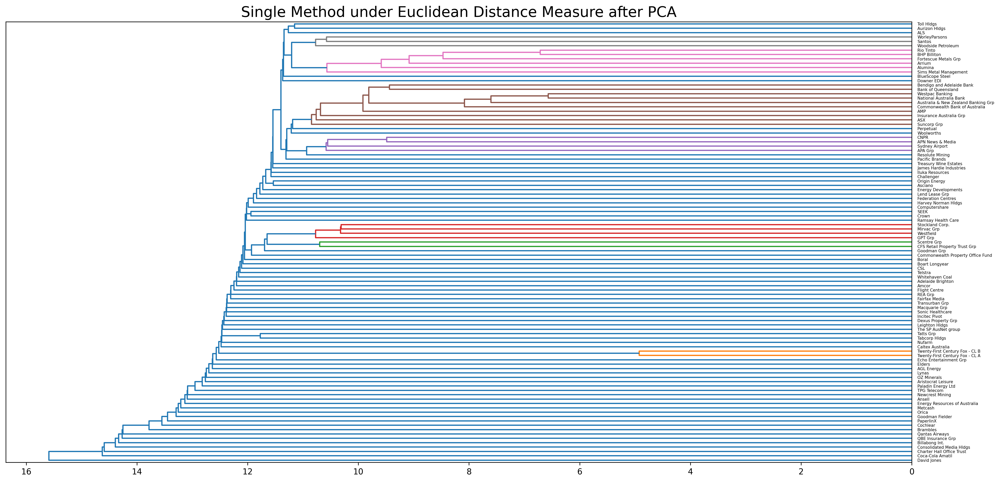

In [125]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'single', metric = 'euclidean')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Single Method under Euclidean Distance Measure after PCA', fontsize = 18)
plt.savefig('Single_Euclidean_PCA.png')
plt.show()

###### - Manhattan

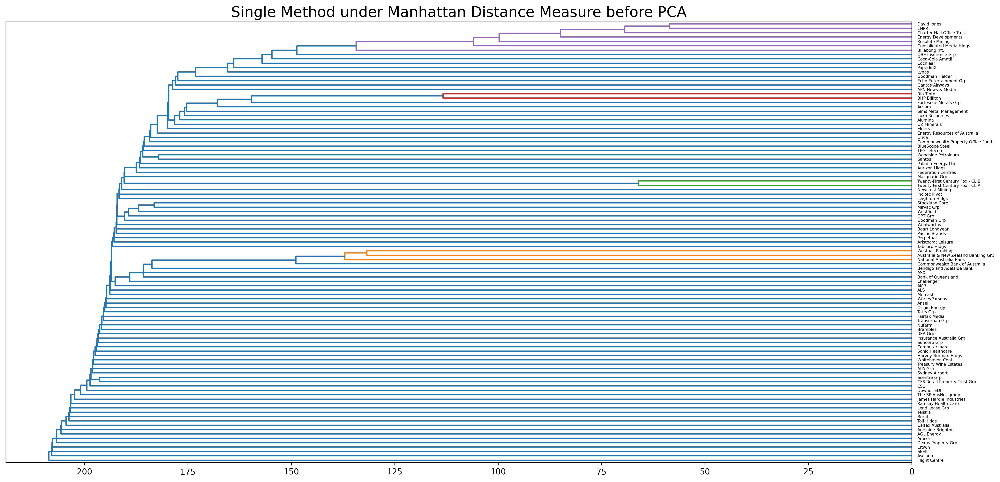

In [107]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'single', metric = 'cityblock')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Single Method under Manhattan Distance Measure before PCA', fontsize = 18)
plt.savefig('Single_Manhattan_pre_PCA.png')
plt.show()

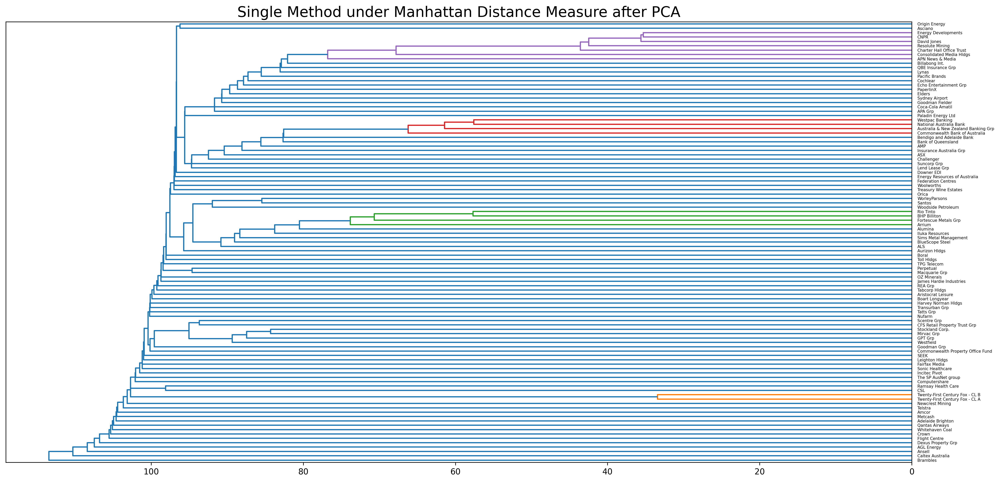

In [109]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'single', metric = 'cityblock')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Single Method under Manhattan Distance Measure after PCA', fontsize = 18)
plt.savefig('Single_Manhattan_PCA.png')
plt.show()

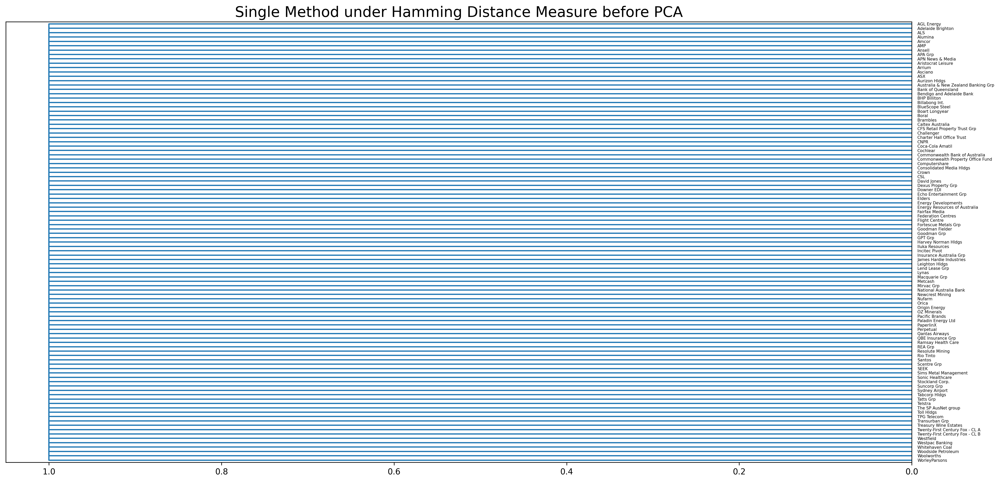

In [118]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'single', metric = 'hamming')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Single Method under Hamming Distance Measure before PCA', fontsize = 18)
plt.savefig('Single_Hamming_pre_PCA.png')
plt.show()

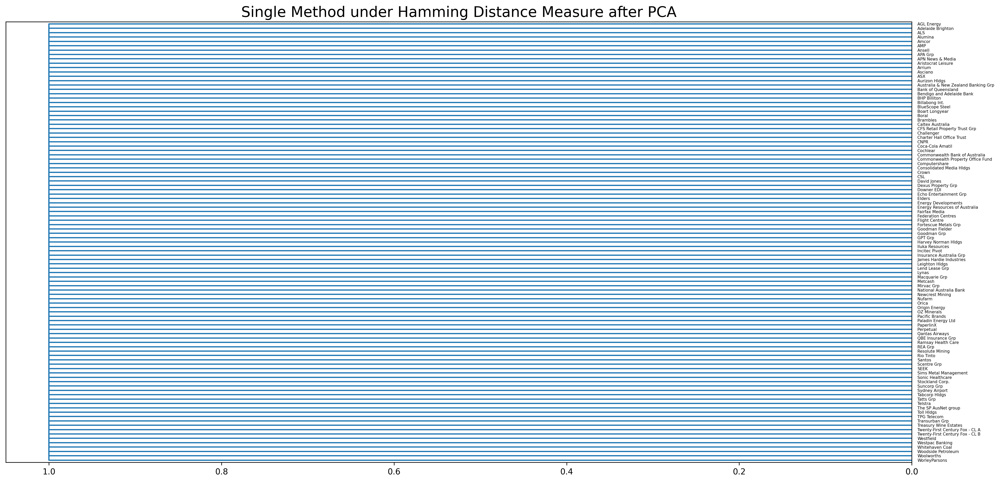

In [119]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'single', metric = 'hamming')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Single Method under Hamming Distance Measure after PCA', fontsize = 18)
plt.savefig('Single_Hamming_PCA.png')
plt.show()

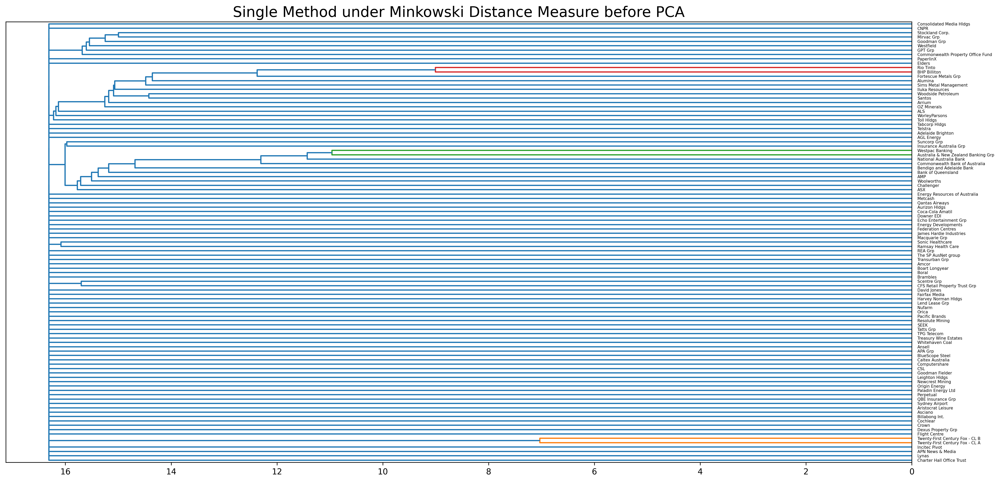

In [120]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'single', metric = 'minkowski')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Single Method under Minkowski Distance Measure before PCA', fontsize = 18)
plt.savefig('Single_Minkowski_pre_PCA.png')
plt.show()

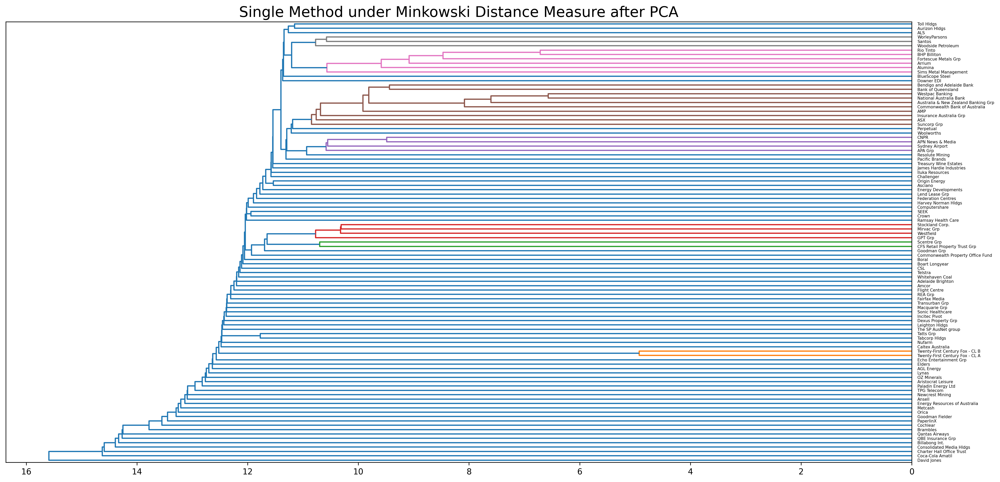

In [121]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'single', metric = 'minkowski')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Single Method under Minkowski Distance Measure after PCA', fontsize = 18)
plt.savefig('Single_Minkowski_PCA.png')
plt.show()

##### Complete

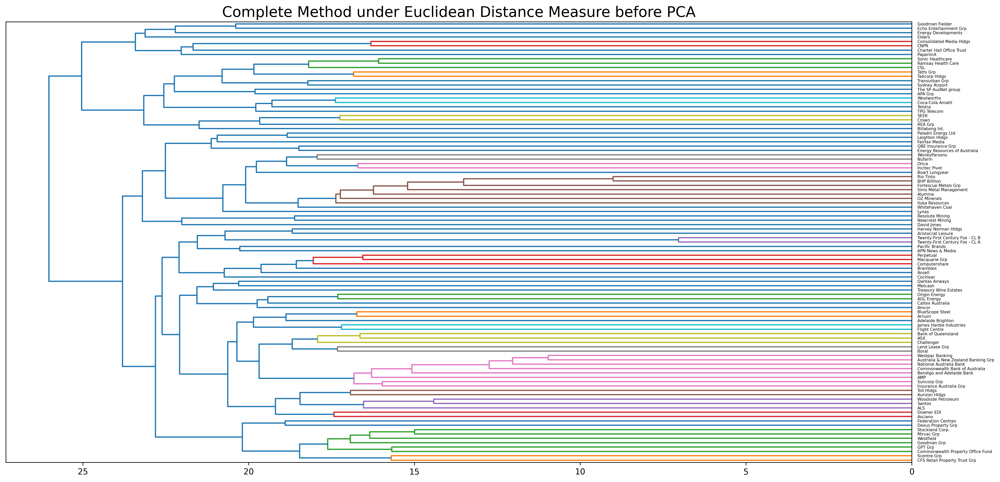

In [123]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'complete', metric = 'euclidean')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Complete Method under Euclidean Distance Measure before PCA', fontsize = 18)
plt.savefig('Complete_Euclidean_pre_PCA.png')
plt.show()

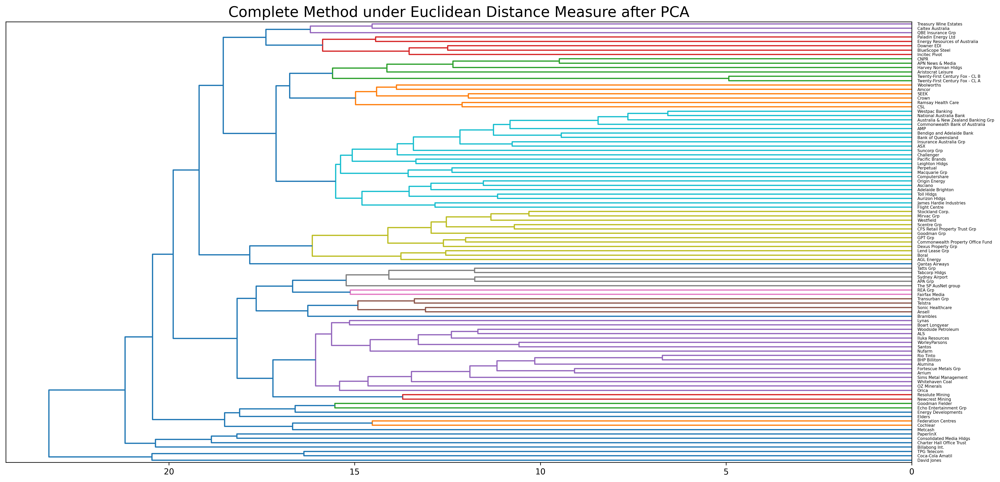

In [126]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'complete', metric = 'euclidean')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Complete Method under Euclidean Distance Measure after PCA', fontsize = 18)
plt.savefig('Complete_Euclidean_PCA.png')
plt.show()

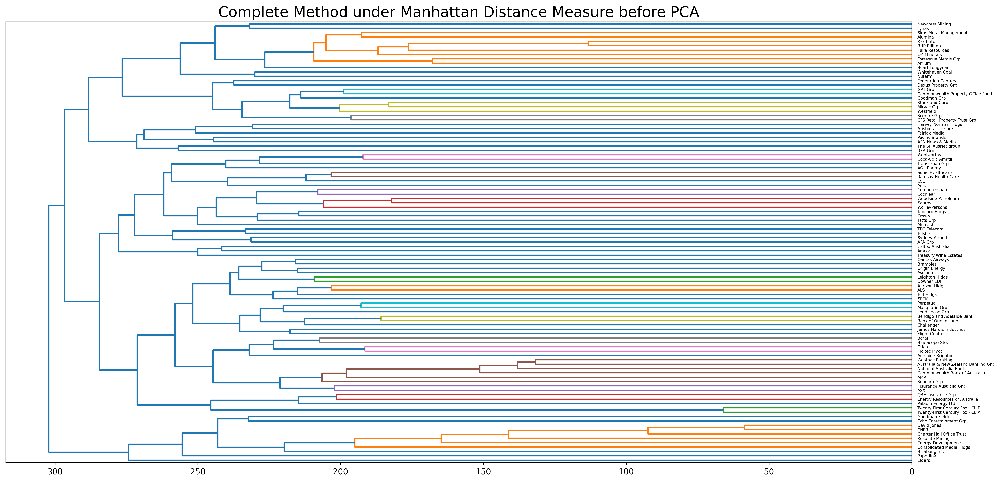

In [127]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'complete', metric = 'cityblock')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Complete Method under Manhattan Distance Measure before PCA', fontsize = 18)
plt.savefig('Complete_Manhattan_pre_PCA.png')
plt.show()

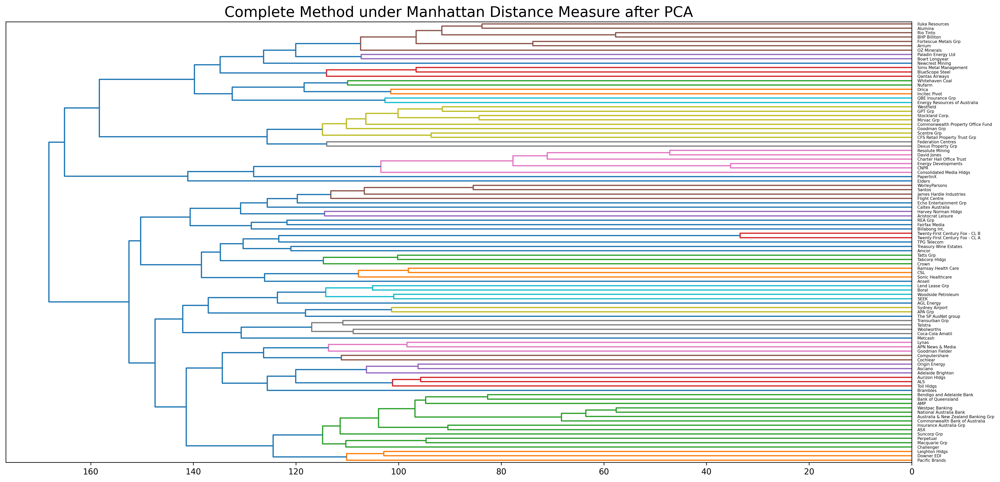

In [128]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'complete', metric = 'cityblock')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Complete Method under Manhattan Distance Measure after PCA', fontsize = 18)
plt.savefig('Complete_Manhattan_PCA.png')
plt.show()

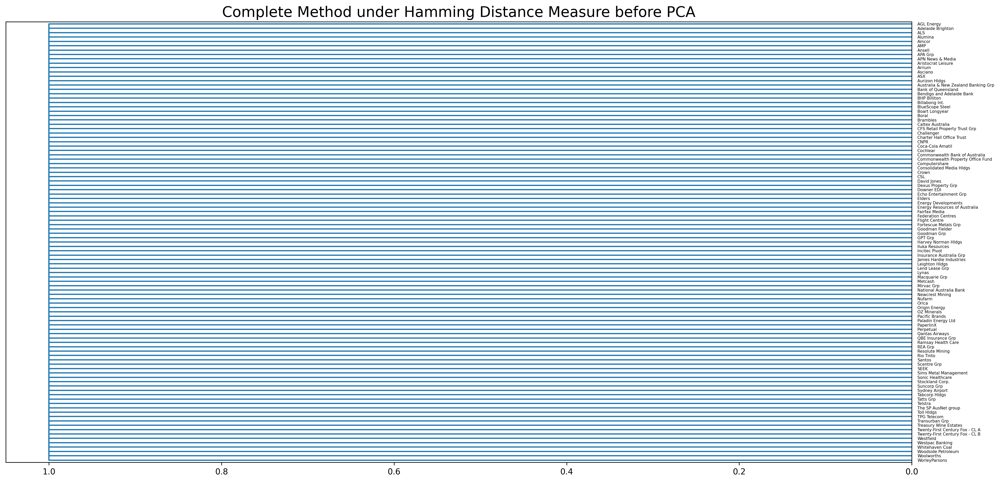

In [129]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'complete', metric = 'hamming')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Complete Method under Hamming Distance Measure before PCA', fontsize = 18)
plt.savefig('Complete_Hamming_pre_PCA.png')
plt.show()

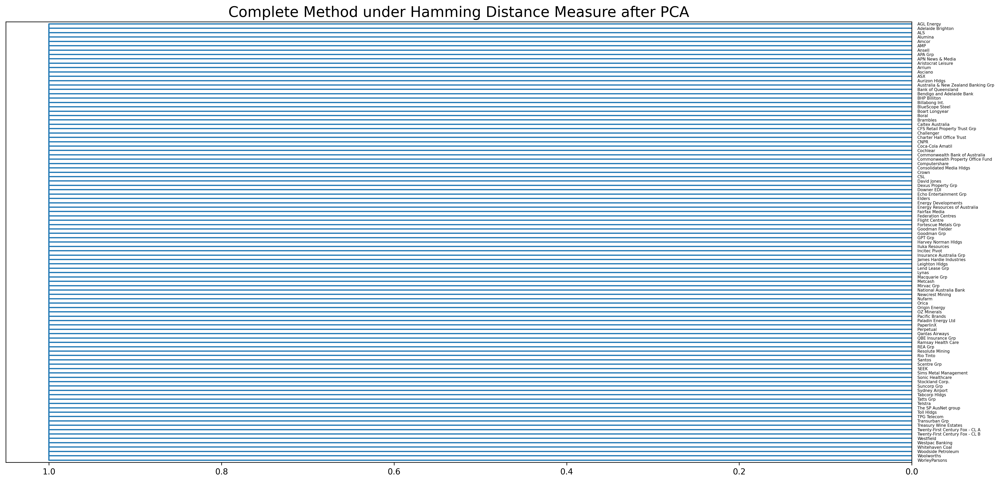

In [130]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'complete', metric = 'hamming')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Complete Method under Hamming Distance Measure after PCA', fontsize = 18)
plt.savefig('Complete_Hamming_PCA.png')
plt.show()

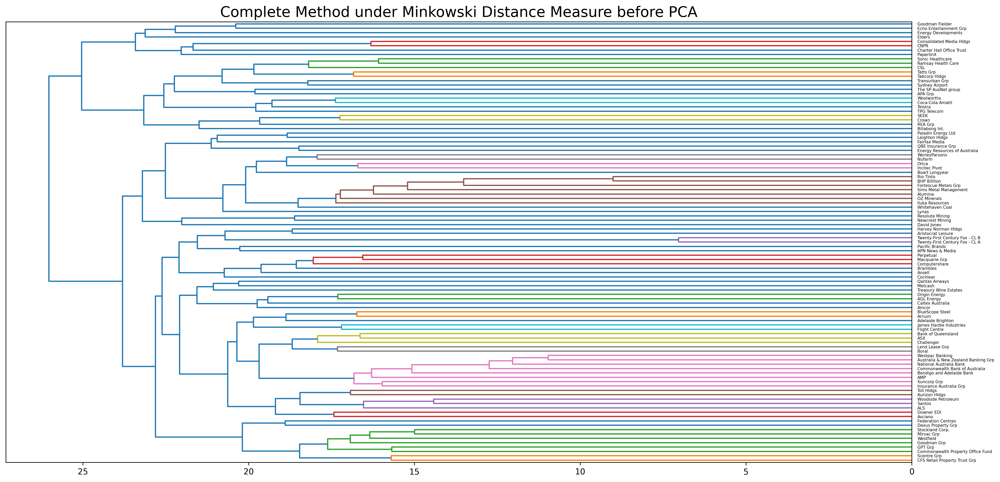

In [131]:
#before pca
plt.figure(figsize = (20, 10), dpi = 300)
link_euclidean = linkage(X_scaled_df.T, method = 'complete', metric = 'minkowski')
dendrogram(link_euclidean, orientation = 'left', labels = X_scaled_df.columns)
plt.title('Complete Method under Minkowski Distance Measure before PCA', fontsize = 18)
plt.savefig('Complete_Minkowski_pre_PCA.png')
plt.show()

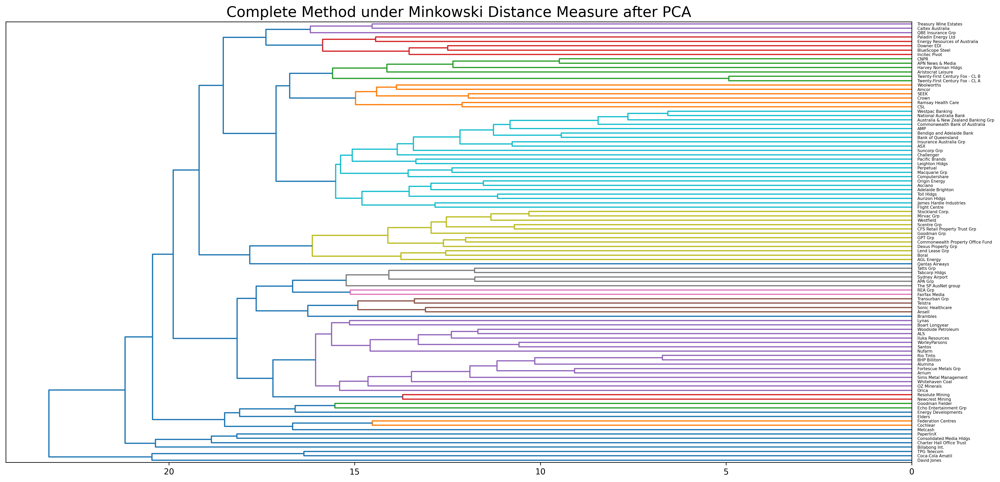

In [132]:
#after pca
plt.figure(figsize = (20, 10), dpi = 300)
link = linkage(X_scaled_pca.T, method = 'complete', metric = 'minkowski')
dendrogram(link, orientation = 'left', labels = X_scaled_pca.columns)
plt.title('Complete Method under Minkowski Distance Measure after PCA', fontsize = 18)
plt.savefig('Complete_Minkowski_PCA.png')
plt.show()

### Discussion
- Ward method with Euclidean distance measure can identify industry groups the best here, and it gives an even better result after PCA, which can be told by it's more "sensitive" to the features. For example, it gives more clear separation between financial services industry and property industry. And it groups Twice-First Centrury Fox - CL B and Twice-First Centrury Fox - CL A into media&entertainment industry after reduce noise, while it's hard for other method to group the twins into its industry.  
<br/>

- Average Method: Improves the most after PCA, but it still cannot identify different industrial characters well. Euclidean measure is better than other measure under Average method. But the results includes several small groups that only contain 2 or 3 companies.
<br/>

- Single Method: Performs the worst among the 4 methods. The results includes either very large groups or very small groups.
<br/>

- Complete Method: With Minkowski distance measure it can derive better results than other measure, while it could be over-sensitive to the input features, resulting more small groups.
<br/>

- Among the 4 distance measures been applied here, Enclidean measure is the most helpful one for clustering companies in this case. Minkowski, which is a generalization of the Euclidean and Manhattan distance measures and adds a parameter, also can give a good result with Complete method. Hamming distance measure is poor to be applied for this case regardless the methods and the impact of noise, given it is designed for calculating the distance between 2 binary vectors. Manhattan is perhaps more useful to vectors that describe objects on a uniform grid.
<br/>

- Performance of the methods with different distance measures may depends on the right combination between the two for certain problems. 
<br/>

- Generally, clustering performance has improved after dimension reduction for almost all the method.